### Classifiers on home-credit-default (Gradient Boosted and Random Forest)


#### This program uses the dataset "application_train.csv"available at "https://www.kaggle.com/c/home-credit-default-risk/data"¶

In [1]:
#importing necessary packages

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.combine import SMOTETomek
from sklearn import tree


#Customizing figure features

plt.style.use('seaborn-paper')
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
plt.rcParams.update(plt.rcParamsDefault) 

In [279]:
# Setting the dataset filepath

os.chdir("/Users/ratulnandy/Documents/GitHub/assignment_1-1-ratul-nandy/Module_3")
df_train_wh = pd.read_csv('application_train.csv')

### Data Cleaning

#### Visualizing the missing data in the dataset

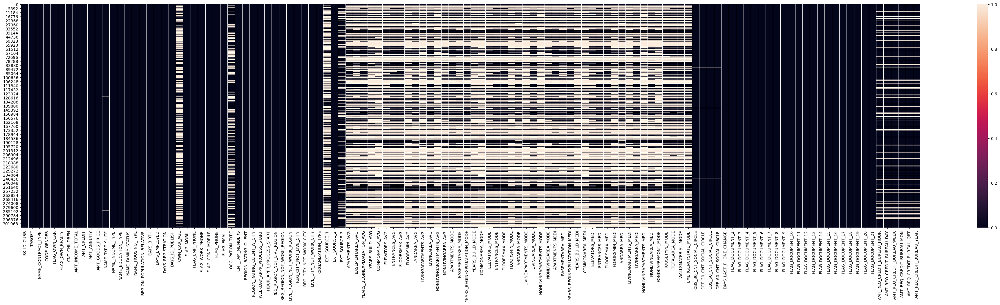

In [34]:
# Heatmap to visualize missing values in the dataset

fig, ax = plt.subplots(figsize=(50,10)) 
sns.heatmap(df_train_wh.isnull())
plt.show()

In [3]:
# Shape of the dataframe

df_train_wh.shape

(307511, 122)

In [4]:
# Finding columns with more than 30% missing data (NaN)

column_with_nan = df_train_wh.columns[df_train_wh.isnull().any()]
for column in column_with_nan:
    if df_train_wh[column].isnull().sum()*100.0/df_train_wh.shape[0] > 30:
        print(column,'-', df_train_wh[column].isnull().sum()*100.0/df_train_wh.shape[0])

OWN_CAR_AGE - 65.9908100848425
OCCUPATION_TYPE - 31.345545362604916
EXT_SOURCE_1 - 56.38107254699832
APARTMENTS_AVG - 50.749729277977046
BASEMENTAREA_AVG - 58.515955526794166
YEARS_BEGINEXPLUATATION_AVG - 48.781019215572776
YEARS_BUILD_AVG - 66.49778381911541
COMMONAREA_AVG - 69.87229725115525
ELEVATORS_AVG - 53.29597965601231
ENTRANCES_AVG - 50.34876801155081
FLOORSMAX_AVG - 49.76082156410665
FLOORSMIN_AVG - 67.84862980511267
LANDAREA_AVG - 59.376737742714894
LIVINGAPARTMENTS_AVG - 68.35495315614726
LIVINGAREA_AVG - 50.193326417591564
NONLIVINGAPARTMENTS_AVG - 69.43296337366793
NONLIVINGAREA_AVG - 55.17916432257708
APARTMENTS_MODE - 50.749729277977046
BASEMENTAREA_MODE - 58.515955526794166
YEARS_BEGINEXPLUATATION_MODE - 48.781019215572776
YEARS_BUILD_MODE - 66.49778381911541
COMMONAREA_MODE - 69.87229725115525
ELEVATORS_MODE - 53.29597965601231
ENTRANCES_MODE - 50.34876801155081
FLOORSMAX_MODE - 49.76082156410665
FLOORSMIN_MODE - 67.84862980511267
LANDAREA_MODE - 59.376737742714894
LI

#### Dropping columns with more than 30% Null values to reduce noise. The columns doesnot seem to contain critical values

#### Justification - These columns contained more than 30% of missing data. These columns were also not important features. By dropping these we can reduce the dimensions of the dataset. We'll still be left with enough features at our disposal for our analysis. The missing data can reduce the statistical power in the analysis and can introduce bias

In [5]:
# Dropping columns with more than 30% missing data

for column in column_with_nan:
    if df_train_wh[column].isnull().sum()*100.0/df_train_wh.shape[0] > 30:
        df_train_wh.drop(column,1, inplace=True)

In [6]:
# New shape of the dataframe

df_train_wh.shape

(307511, 72)

<AxesSubplot:>

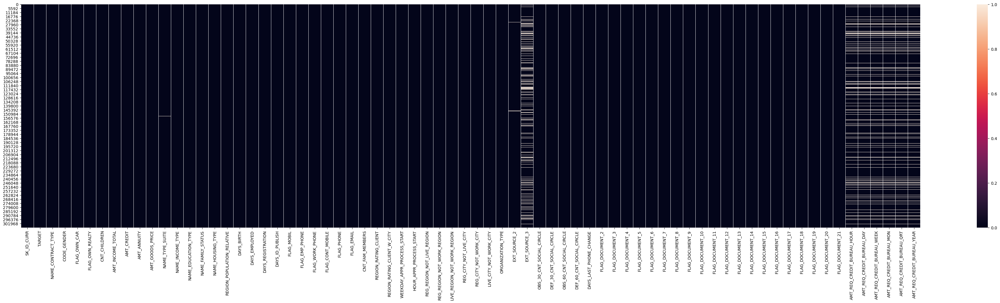

In [188]:
# Heatmap to visualize the new dataset

fig, ax = plt.subplots(figsize=(50,10)) 
sns.heatmap(df_train_wh.isnull())

#### Days Employed seems to be a key feature. Removing rows with invalid data in Days Employed column. This will help get rid of noise

#### Justification - Employment history seems to be an important feature. Some of the rows contained invalid data. Removing the impurities

In [7]:
#Checking number of rows with invalid data

df_train_wh.loc[df_train_wh['DAYS_EMPLOYED'] > 0]


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
8,100011,0,Cash loans,F,N,Y,0,112500.000,1019610.0,33826.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
11,100015,0,Cash loans,F,N,Y,0,38419.155,148365.0,10678.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
23,100027,0,Cash loans,F,N,Y,0,83250.000,239850.0,23850.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
38,100045,0,Cash loans,F,N,Y,0,99000.000,247275.0,17338.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
43,100050,0,Cash loans,F,N,Y,0,108000.000,746280.0,42970.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307469,456209,0,Cash loans,F,N,Y,0,202500.000,703728.0,29943.0,...,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0
307483,456227,0,Cash loans,F,N,Y,0,99000.000,247275.0,16479.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
307487,456231,0,Cash loans,M,N,Y,0,117000.000,1071909.0,31473.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,8.0
307505,456249,0,Cash loans,F,N,Y,0,112500.000,225000.0,22050.0,...,0,0,0,0,0.0,0.0,0.0,2.0,0.0,0.0


In [8]:
# Removing rows with invalid data in column DAYS_EMPLOYED

df_train_wh = df_train_wh[df_train_wh.DAYS_EMPLOYED < 0]

In [41]:
df_train_wh.shape

(252135, 72)

### Data Engineering

#### Converting Categorical values to numeric values using 'One Hot Encoding'

#### Justification - Converting the categorical values to numeric value so that it can be used to determine the variable importance. Objects cannot be used in statistical analysis

In [9]:
# Encoding non-numeric data - One hot encoding

dummy = pd.get_dummies(df_train_wh.NAME_CONTRACT_TYPE, prefix ='NAME_CONTRACT_TYPE' ) 
dummy = dummy.drop(['NAME_CONTRACT_TYPE_Revolving loans'], axis = 'columns') # 0 will denote Revolving loans
df_merged = pd.concat([df_train_wh,dummy],axis='columns') 

# [0,0] will denote data not available
dummy = pd.get_dummies(df_train_wh.CODE_GENDER, prefix='CODE_GENDER')
dummy = dummy.drop(['CODE_GENDER_XNA'], axis = 'columns') 
df_merged = pd.concat([df_merged,dummy],axis='columns')

# 0 will denote FLAG_OWN_CAR_N = 1
dummy = pd.get_dummies(df_train_wh.FLAG_OWN_CAR, prefix ='FLAG_OWN_CAR', drop_first = True ) 
df_merged = pd.concat([df_merged,dummy],axis='columns')

# 0 will denote FLAG_OWN_REALTY_N = 1
dummy = pd.get_dummies(df_train_wh.FLAG_OWN_REALTY, prefix='FLAG_OWN_REALTY', drop_first = True)
df_merged = pd.concat([df_merged,dummy],axis='columns')

dummy = pd.get_dummies(df_train_wh.NAME_TYPE_SUITE, prefix='NAME_TYPE_SUITE')
df_merged = pd.concat([df_merged,dummy],axis='columns')

dummy = pd.get_dummies(df_train_wh.NAME_INCOME_TYPE, prefix='NAME_INCOME_TYPE')
df_merged = pd.concat([df_merged,dummy],axis='columns')

dummy = pd.get_dummies(df_train_wh.NAME_EDUCATION_TYPE, prefix='NAME_EDUCATION_TYPE')
df_merged = pd.concat([df_merged,dummy],axis='columns')

dummy = pd.get_dummies(df_train_wh.NAME_FAMILY_STATUS, prefix='NAME_FAMILY_STATUS')
df_merged = pd.concat([df_merged,dummy],axis='columns')

dummy = pd.get_dummies(df_train_wh.NAME_HOUSING_TYPE, prefix='NAME_HOUSING_TYPE')
df_merged = pd.concat([df_merged,dummy],axis='columns')

dummy = pd.get_dummies(df_train_wh.WEEKDAY_APPR_PROCESS_START, prefix='WEEKDAY_APPR_PROCESS_START')
df_merged = pd.concat([df_merged,dummy],axis='columns')

dummy = pd.get_dummies(df_train_wh.ORGANIZATION_TYPE, prefix='ORGANIZATION_TYPE')
df_merged = pd.concat([df_merged,dummy],axis='columns')


#### Creating a dataset with only numeric data

In [10]:
# Creating a clean dataset with only numeric data

df_clean = df_merged.drop(['SK_ID_CURR','NAME_CONTRACT_TYPE','CODE_GENDER','FLAG_OWN_CAR','FLAG_OWN_REALTY','NAME_TYPE_SUITE','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE','WEEKDAY_APPR_PROCESS_START','ORGANIZATION_TYPE'], axis =1 )
                           
                           

#### Checking for null value in the present dataset

In [11]:
# Checking for null values in the present dataset

df_clean.columns[df_clean.isnull().any()]

Index(['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

#### Imputing missing values

#### Justification - Imputation can yield unbiased estimates. It will reduce the uncertainities in the dataset

In [12]:
# Replacing the missing data
df_final = df_clean.interpolate()

In [13]:
df_final.shape

(252135, 160)

#### Checking for constant variable or columns with 0 variance

#### Justification - Checking for any feature where there is only one type of values or 0 variance. Those features could be dropped as it doesnot contribute to the analysis

In [43]:
var_thres = VarianceThreshold(threshold=0)
var_thres.fit(df_final)

VarianceThreshold(threshold=0)

In [15]:
df_final.columns[var_thres.get_support()]

Index(['TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
       ...
       'ORGANIZATION_TYPE_Trade: type 3', 'ORGANIZATION_TYPE_Trade: type 4',
       'ORGANIZATION_TYPE_Trade: type 5', 'ORGANIZATION_TYPE_Trade: type 6',
       'ORGANIZATION_TYPE_Trade: type 7',
       'ORGANIZATION_TYPE_Transport: type 1',
       'ORGANIZATION_TYPE_Transport: type 2',
       'ORGANIZATION_TYPE_Transport: type 3',
       'ORGANIZATION_TYPE_Transport: type 4', 'ORGANIZATION_TYPE_University'],
      dtype='object', length=160)

#### No coulmns was found with 0 variance

### Splitting the dataset into test data and training data

#### Justification - Splitting the dataset into train and test dataset to train and test the model

In [16]:
# Splitting the dataset into training data and test data

data_train, data_test = train_test_split(df_final, test_size = 0.25, random_state =42)

# Preparing the training dataset

data_train_input = data_train.drop(['TARGET'], axis = 'columns')
data_train_target = data_train[['TARGET']]

# Preparing the testing dataset

data_test_input = data_test.drop(['TARGET'], axis = 'columns')
data_test_target = data_test[['TARGET']]


#### Checking for correlation amongst the features

In [204]:
# Using Pearson Correlation

plt.figure(figsize=(100,100))
cor = data_train_input.corr()
sns.heatmap(cor, annot = True, cmap = plt.cm.CMRmap_r)
plt.show()

In [17]:
# Creating a function to identify variables which are correlated to other variables

def correlation(data, threshold):
    list_xc = []
    list_yc = []
    c_matrix = data.corr()
    for i in range(len(c_matrix.columns)):
        for j in range(i):
            if abs(c_matrix.iloc[i,j]>threshold):
                list_xc.append(c_matrix.columns[i])
                list_yc.append(c_matrix.columns[j])
    
    mat_xc = np.asarray(list_xc)
    mat_yc = np.asarray(list_yc)
    mat_f = np.column_stack((mat_xc, mat_yc))
    return mat_f

In [290]:
# Checking for 80% correlation

corr_features = correlation(data_train_input,0.8)

In [19]:
corr_features

array([['AMT_GOODS_PRICE', 'AMT_CREDIT'],
       ['CNT_FAM_MEMBERS', 'CNT_CHILDREN'],
       ['REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT'],
       ['LIVE_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_WORK_REGION'],
       ['LIVE_CITY_NOT_WORK_CITY', 'REG_CITY_NOT_WORK_CITY'],
       ['OBS_60_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE'],
       ['DEF_60_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE']],
      dtype='<U27')

#### Dropping the correlated features from both train data and test data

#### Justification - If two features are correlated then second feature will not contribute much to the analysis. Only one feature can be used as the representation and also we can reduce the  dimensions

In [135]:
train_input = data_train_input.drop(['AMT_GOODS_PRICE','CNT_FAM_MEMBERS','REGION_RATING_CLIENT_W_CITY','LIVE_REGION_NOT_WORK_REGION','LIVE_CITY_NOT_WORK_CITY','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE'], axis = 'columns')
test_input = data_test_input.drop(['AMT_GOODS_PRICE','CNT_FAM_MEMBERS','REGION_RATING_CLIENT_W_CITY','LIVE_REGION_NOT_WORK_REGION','LIVE_CITY_NOT_WORK_CITY','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE'], axis = 'columns')


### Feature Selection

#### Checking the F-Value to find the top 10 important features

In [55]:
# Selecting 10 best features using F-Value

best_features = SelectKBest(f_classif,k=10)
f_fit = best_features.fit(train_input,data_train_target.values.ravel())
f_scores = pd.DataFrame(f_fit.scores_)
f_columns = pd.DataFrame(train_input.columns)


In [69]:
f_feature_scores = pd.concat([f_columns, f_scores],axis=1)
f_feature_scores.columns = ['Feature_Name','Score']
f_top10 = feature_scores.nlargest(10,'Score')

In [75]:
# Top 10 variables for F-Score

f_top10.set_index('Feature_Name')

,Score
Feature_Name,
EXT_SOURCE_2,5609.255382
EXT_SOURCE_3,4449.298455
DAYS_EMPLOYED,1017.740750
REGION_RATING_CLIENT,831.197029
NAME_EDUCATION_TYPE_Higher education,830.445801
DAYS_BIRTH,817.339532
DAYS_LAST_PHONE_CHANGE,689.345523
NAME_EDUCATION_TYPE_Secondary / secondary special,672.330028
CODE_GENDER_M,452.122099


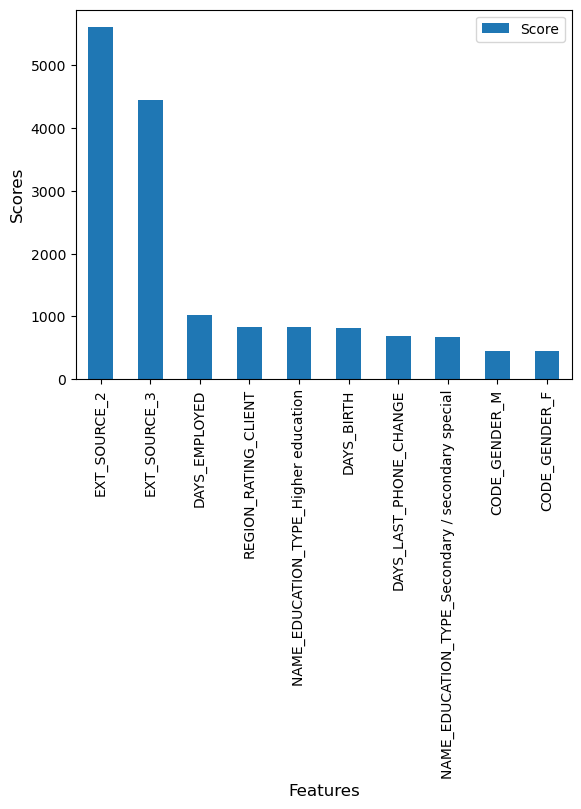

In [82]:
# Plotting the graph for top variables

ax = f_top10.plot.bar(x ='Feature_Name', y = 'Score')
ax.set_xlabel("Features", fontsize=12)
ax.set_ylabel("Scores", fontsize=12)
plt.show()

### Creating a Random Forest to find out the top 10 features

In [84]:
# Creating a Random Forest

rf1_model = RandomForestClassifier(class_weight = 'balanced', criterion = 'gini', max_depth = 50, max_features = 10, n_estimators = 5)
rf1_model.fit(train_input,data_train_target.values.ravel())


RandomForestClassifier(class_weight='balanced', max_depth=50, max_features=10,
                       n_estimators=5)

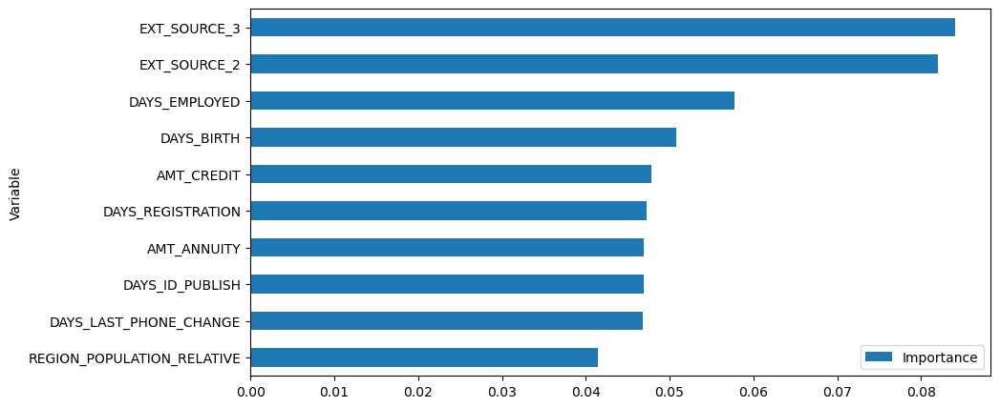

In [87]:
# Creating the variable importance chart based on random forest

var_columns = [ c for c in train_input]
rf_var_imp = pd.DataFrame({'Variable': var_columns, 'Importance': rf1_model.feature_importances_}).sort_values(by='Importance', ascending= False).reset_index(drop=True) 
rf_var_imp[:10].sort_values('Importance').plot('Variable','Importance','barh', figsize =(10,5))    
plt.show()


### Final Selected Features - EXT_SOURCE_3, EXT_SOURCE_3, DAYS_EMPLOYED, DAYS_BIRTH & AMT_CREDIT

#### Justification - Using both the F-Value and Random Forest to decide the top 10 features

### Checking the balance in the dataset for 'Target Variable'

#### Justification - The dataset seems to be highly imbalanced. This will create a bias in the training model 

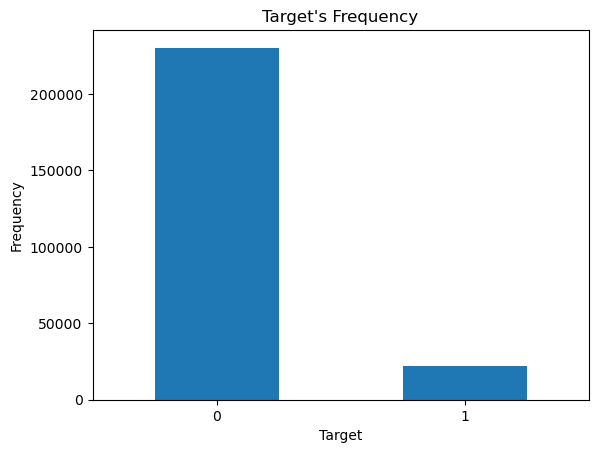

In [56]:
count_target = df_final.value_counts(df_final['TARGET'], sort = True )
count_target.plot(kind='bar', rot=0)
plt.title("Target's Frequency")
plt.xlabel('Target')
plt.ylabel('Frequency')
plt.show()

#### Justification - The training dataset is highly imbalanced. Therefore we need to perform "Over-Sampling". By performing under-sampling we'll lose data and as a result the model will not perform well

In [194]:
# Performing over-sampling

smk = SMOTETomek(random_state=42)
u_train,u_train_target = smk.fit_sample(train_input,data_train_target)


In [195]:
# Checking the new shape of the datasets

u_train.shape

(341756, 152)

### Creating the final training dataset with the chosen variables

#### Justification - Chosing 7 features out of the 10 features. After fine tuning the parameters it is observed that  7 features is producing maximum accuracy 

In [266]:
# Preparing the training dataset

Final_train_1 = u_train[['EXT_SOURCE_3', 'EXT_SOURCE_3', 'DAYS_EMPLOYED', 'DAYS_BIRTH','AMT_CREDIT','DAYS_REGISTRATION','AMT_CREDIT']]
Final_train_target_1 = u_train_target

#Preparing the test dataset

Final_test_1 = test_input[['EXT_SOURCE_3', 'EXT_SOURCE_3', 'DAYS_EMPLOYED', 'DAYS_BIRTH','AMT_CREDIT','DAYS_REGISTRATION','AMT_CREDIT']]
Final_test_target_1 = data_test_target


### Preparing the decision tree

In [267]:
# Fitting the Decision Tree

clf = tree.DecisionTreeClassifier(random_state = 42, max_depth = 78)
model_tree = clf.fit(Final_train_1, Final_train_target_1)


#### Checking the prediction


In [268]:
# Model prediction test 

model_tree.score(Final_test_1,Final_test_target_1)

0.6662753434654314

### Preparing the gradient boosted tree

#### Justification - The parameters were decided based on manual hypertuning

In [288]:
# Fitting Gradient Boosted Tree

gbt = GradientBoostingClassifier(n_estimators=30, max_depth=100, learning_rate=0.1, min_samples_leaf=9)
model_gbt = gbt.fit(Final_train_1, Final_train_target_1.values.ravel())


#### Checking the prediction

In [289]:
model_gbt.score(Final_test_1,Final_test_target_1)

0.7645239077323349